# Loan Default Prediction using XGBoost, LightGBM and CatBoost

##  Business Objective: To predict the eligibility of a loan applicant towards being granted a loan, by deducing the likelihood that they default on their repayment. 

### Features provided in raw dataset:
* ID
* Age of Applicant
* Income of Applicant
* Home Ownership Type
* Length of Employment History
* Reason for applying for Loan
* Risk Grade
* Principal Loan Amount
* Interest Rate on Loan
* Principal Loan Amount as a percentage of Applicant Income
* Default History
* Length of Credit History

Here our approach is to use an ensemble of Gradient Boosting Machines so as to improve our capability towards handling outliers as well as to deal with any suspected overfitting while not having to sacrifice on the accuracy of classification.

We have been assigned with an evaluation criteria of Area under ROC Curve. This measures True Positive Rate against the True Negative Rate of our model's performance.

#### Preliminary phase of our project deals with the Exploratory Data Analysis (EDA) required to understand our data and its intricacies.

To that end, we import the pandas, numpy, matplotlib, seaborn and plotly libraries to explore and investigate our data. We then read the input csv files using pandas and obtain a sample to get a feel of what the dataset looks like.

In [2]:
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)

df_train = pd.read_csv('/kaggle/input/loans-predictions/train.csv')
df_test = pd.read_csv('/kaggle/input/loans-predictions/test.csv')

df_train.sample(5)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
50538,50538,24,120000,MORTGAGE,8.0,PERSONAL,B,16000,10.37,0.13,N,2,0
51630,51630,25,64000,RENT,7.0,DEBTCONSOLIDATION,D,8000,15.28,0.13,N,3,1
19821,19821,28,44000,RENT,2.0,MEDICAL,D,13000,15.31,0.30,Y,8,1
49624,49624,28,30000,RENT,3.0,PERSONAL,B,6000,10.38,0.20,N,5,0
46767,46767,28,40000,RENT,12.0,VENTURE,B,12000,9.91,0.30,N,9,0


In [7]:
df_test.sample(5)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
27338,85983,26,30000,RENT,0.0,PERSONAL,B,7000,10.99,0.23,N,4
35131,93776,28,47600,RENT,5.0,MEDICAL,C,6000,12.53,0.13,Y,10
25087,83732,26,40000,RENT,5.0,MEDICAL,D,10000,16.77,0.25,Y,4
8218,66863,23,37000,MORTGAGE,2.0,VENTURE,B,2800,10.95,0.08,N,3
10878,69523,30,48000,RENT,14.0,DEBTCONSOLIDATION,A,15000,7.49,0.31,N,5


The above two outputs were the training dataset (with target column) and the test dataset (without the target column) respectively.
Now we inspect the datasets to see if there are any empty values

In [8]:
df_train.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [10]:
df_train.isna().sum()

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

In [11]:
df_test.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
count,39098.000000,39098.000000,3.909800e+04,39098.000000,39098.000000,39098.000000,39098.000000,39098.000000
mean,78193.500000,27.566781,6.406046e+04,4.687068,9251.466188,10.661216,0.159573,5.830707
std,11286.764749,6.032761,3.795583e+04,3.868395,5576.254680,3.020220,0.091633,4.072157
min,58645.000000,20.000000,4.000000e+03,0.000000,700.000000,5.420000,0.000000,2.000000
25%,68419.250000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000
50%,78193.500000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000
75%,87967.750000,30.000000,7.588500e+04,7.000000,12000.000000,12.990000,0.210000,8.000000
max,97742.000000,94.000000,1.900000e+06,42.000000,35000.000000,22.110000,0.730000,30.000000


In [14]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39098 non-null  int64  
 1   person_age                  39098 non-null  int64  
 2   person_income               39098 non-null  int64  
 3   person_home_ownership       39098 non-null  object 
 4   person_emp_length           39098 non-null  float64
 5   loan_intent                 39098 non-null  object 
 6   loan_grade                  39098 non-null  object 
 7   loan_amnt                   39098 non-null  int64  
 8   loan_int_rate               39098 non-null  float64
 9   loan_percent_income         39098 non-null  float64
 10  cb_person_default_on_file   39098 non-null  object 
 11  cb_person_cred_hist_length  39098 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.6+ MB


In [15]:
df_test.isna().sum()

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

We can see that the id column is present in the dataset. The ID is just to identify the applicant and as such, presents no actual relevance to the analysis. We can remove it now.

In [3]:
df_train = df_train.drop(columns=['id'])
df_test = df_test.drop(columns=['id'])

In [4]:
df_train.head(5)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


In [18]:
df_test.head(5)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,23,69000,RENT,3.0,HOMEIMPROVEMENT,F,25000,15.76,0.36,N,2
1,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4
2,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2
3,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7
4,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4


We install required libraries for visualization in EDA.

In [5]:
!pip install plotly matplotlib seaborn --quiet

In [6]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

Let us first find out how many application are accepted or rejected.

In [21]:
fig = px.histogram(df_train,
              x = 'loan_status',
              color = 'loan_status',
              category_orders = {"loan_status": [1,0]},
              title='Loan Eligibility Distribution')
fig.update_layout(bargap=0.5)
fig.update_xaxes(showticklabels=False)
fig.show()

Now let us write a function to plot interactive histograms for every feature and its relation to loan acceptance.

In [22]:
def histograms():  
    target = df_train.loan_status
    for feature in df_train.columns[:-1]:
        figure = px.histogram(df_train,
                     x=feature,
                     color=target,
                     category_orders = {"loan_status": [1,0]},       
                     title = f" Distributions of {feature} by loan status")
        figure.show()


histograms()      

Pretty hilarious to note that there are two individuals with more than 100 years of employment history! But coming back to business, we observe a trend that signifies a relation of the loan eligibility with features such as loan amount (almost linear).

Another discovery is that the likelihood of being granted a loan increases when a person uses rented accomodation, with mortgages being the worst option in that sense.

Now we plot a series of scatterplots to illustrate the presence (or absence) of certain trend. 

In [23]:

fig = px.scatter(df_train,
           x='loan_amnt',
           y='person_income',
           color= 'loan_status',
           color_continuous_scale=["red", "blue"],  
           opacity = 0.5,      
           title='Loan Amount against Income of Applicant with Loan Eligibility')
fig.show()

In [24]:
fig = px.scatter(df_train,
           x='cb_person_cred_hist_length',
           y='person_emp_length',
           color= 'loan_status',
           color_continuous_scale=["red", "blue"],
           opacity = 0.5,
           title='Employment History against Credit History with Loan Eligibility')
fig.show()

We then look at the loans as a percentage of the income of an applicant and its impact on the eligibility of the person for the applied loan.

In [25]:
fig = px.box(df_train,
             x='loan_status',
             y='loan_percent_income',
             color = 'loan_status',
             
            title= 'Boxplot of Loan as a percent of income on Eligibility')
fig.show()

Next up is grading loans and looking at the average amounts that applicants of those loan grades applied for. 

In [26]:
fig = px.violin(df_train,
                x='loan_grade',
                y='loan_amnt',
                color = 'loan_status',
                category_orders = {"loan_status": [1,0]},
                box=True,
                points="all",
                title= 'Violin plot of Loan Grades against their Loan Amounts')
fig.show()

In [27]:
fig = px.bar_polar(df_train.groupby(['loan_intent', 'loan_grade'])['loan_status'].sum().reset_index(),
                   r="loan_status",
                   theta="loan_intent",
                   color="loan_grade",
                   color_discrete_sequence= px.colors.sequential.Plasma_r,
                   title="Intent wise distribution of successful loans according to risk grades")
fig.update_polars(radialaxis_ticks="outside")
fig.update_layout(title_x=0.5)
                  
fig.show()

We find that medical loans were disbursed the most with venture loans disbursed the least. D graded loans were the most accepted applications. This might have something to do with the lower graded loans charging higher rates of interest, being the most profitable as such. This category might present the most risk that the bank is willing to incur with lower grades than D not being entertained as much.

In [28]:
fig = px.scatter(df_train,
           x='person_age',      
           y='person_income',
           color= 'loan_status',
           color_continuous_scale = ['red', 'blue'],
           opacity = 0.7,
           title='Applicants Income Against Applicants Age with impact on Eligibility')
fig.show()

Interestingly, we find that across ages of applicants, persons with lower incomes are likelier to have their loan proposal accepted as opposed to those with higher incomes.

In [29]:
fig = px.scatter_matrix(df_train,
                        dimensions=['person_age',
                                    'person_income',
                                    'person_emp_length',
                                    'loan_amnt',
                                    'loan_int_rate',
                                    'loan_percent_income',
                                    'cb_person_cred_hist_length'],
                        color="loan_status",
                        color_continuous_scale = ['red', 'blue'],
                        title = "Scatter Matrix of Numerical Features")
fig.update_layout(autosize=False,
                  width=1000,
                  height=1000,
                  font_size=7.5,
                  title_font_size = 25)
fig.show()

We will now create a pair plot of all the numerical features in the dataset.

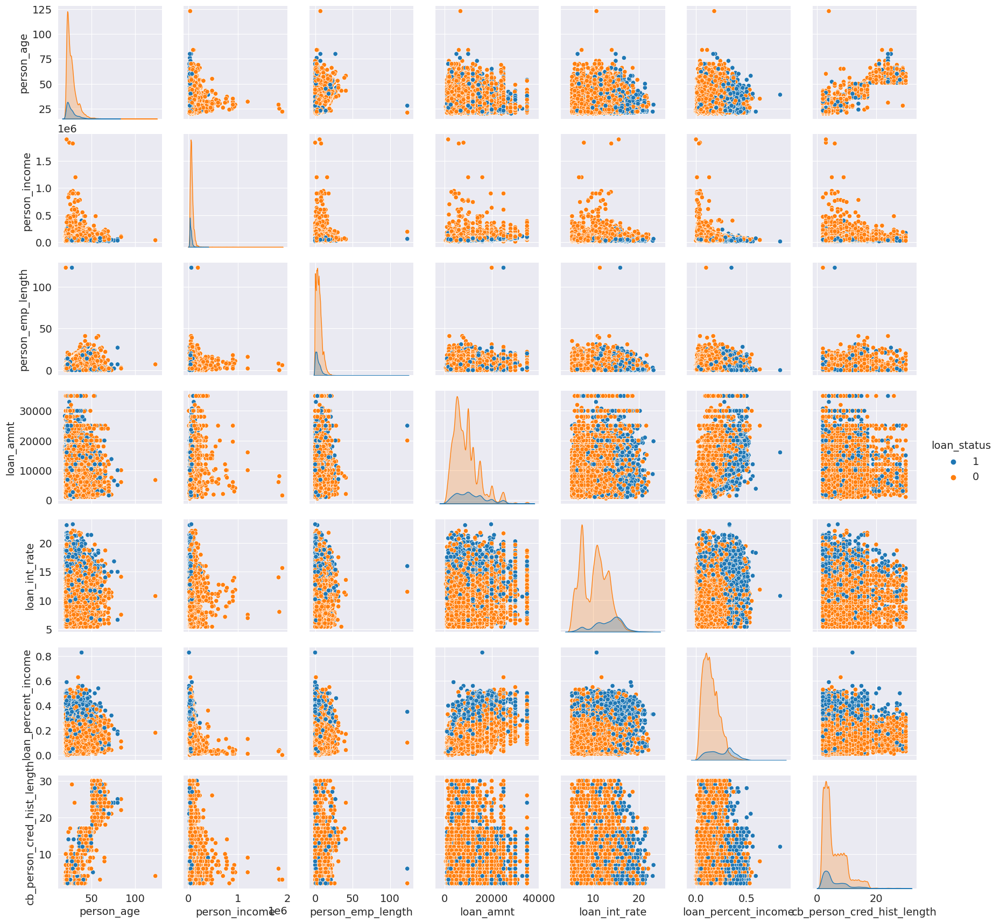

In [30]:
import warnings

warnings.filterwarnings('ignore')

num_cols = ['person_age',
                'person_income',
                'person_emp_length',
                'loan_amnt',
                'loan_int_rate',
                'loan_percent_income',
                'cb_person_cred_hist_length',
                'loan_status']
sns.pairplot(df_train[num_cols], hue='loan_status', hue_order=[1,0])
plt.show()

We are now creating density plots of loan amounts by eligibility. 

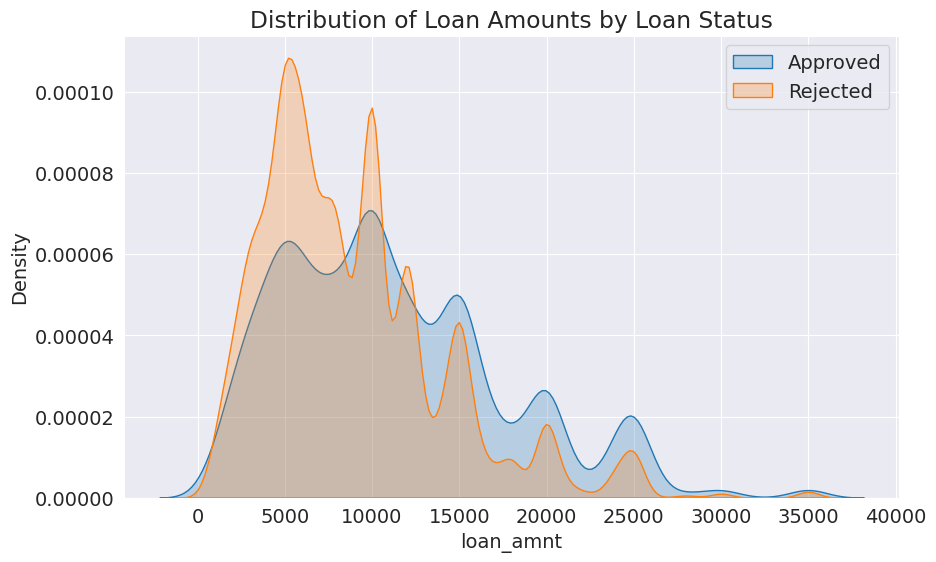

In [31]:
sns.kdeplot(df_train[df_train['loan_status'] == 1]['loan_amnt'], label='Approved', fill=True)
sns.kdeplot(df_train[df_train['loan_status'] == 0]['loan_amnt'], label='Rejected', fill=True)
plt.title('Distribution of Loan Amounts by Loan Status')
plt.ylabel('Density')
plt.legend()
plt.show()

### Now we plot the correlation matrix

Before we start plotting the correlation matrix, we have to convert categorical columns to numerical form. This is called encoding. We can use a number of ways to encode our categorical features. The most common way to do this is One-Hot Encoding but most of our categorical features are to an extent, hierarchical. This means we can use Label Encoding. We will use OHE but only for the loan intent feature.

In [31]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

cat_cols = ['person_home_ownership',
                'loan_grade', 
                'cb_person_default_on_file']
num_col = ['person_age',
                'person_income',
                'person_emp_length',
                'loan_amnt',
                'loan_int_rate',
                'loan_percent_income',
                'cb_person_cred_hist_length']

def encode_data(df,target, new_features):
    enc = LabelEncoder() 
    for col in cat_cols:
        df[col] = enc.fit_transform(df[col])
    
    ohe = OneHotEncoder(sparse=False, handle_unknown='ignore').fit(df[['loan_intent']])
    ohe_cols = list(ohe.get_feature_names_out(['loan_intent']))
    df[ohe_cols] = ohe.transform(df[['loan_intent']])
    num_cols = num_col + target
    return df[num_cols+ohe_cols+cat_cols+new_features]
        
new_features, target = [], ['loan_status']
corr_mtrx = encode_data(df_train, target, new_features).corr()
fig = px.imshow(corr_mtrx, text_auto=True)
fig.update_layout(title="Correlation heatmap",
                  width=1200,
                  height=1400,
                  xaxis={"tickangle": 45},
                  yaxis_nticks=len(num_cols+cat_cols)+6)
fig.show()


/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



### Feature Engineering

Now we can come up with some additional features. The first feature we will engineer is the ratio of income of applicant to loan amount applied for.

In [32]:
df_train['income_debt_ratio'] = df_train['person_income'] / df_train['loan_amnt']
df_test['income_debt_ratio'] = df_test['person_income'] / df_test['loan_amnt']

The second feature is the ratio of income to the length of employment history of the applicant.

In [33]:
df_train['yearly_income'] = (df_train['person_income'] / (df_train['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)
df_test['yearly_income'] = (df_test['person_income'] / (df_test['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)

The next feature we will engineer is the total debt incurred as part of the loan for a year.

In [34]:
df_train['yearly_debt'] = df_train['loan_amnt'] * df_train['loan_int_rate']
df_test['yearly_debt'] = df_test['loan_amnt'] * df_test['loan_int_rate']

The next feature is the ratio of the loan amount to the length of the total credit history of the applicant on file. 

In [35]:
df_train['debt_credit_ratio'] = df_train['loan_amnt'] / df_train['cb_person_cred_hist_length']
df_test['debt_credit_ratio'] = df_test['loan_amnt'] / df_test['cb_person_cred_hist_length'] 

Next, we look at the ratio of the loan amount to the length of the applicant's employment history on file.

In [36]:
df_train['debt_employment_ratio'] = (df_train['loan_amnt'] / (df_train['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)
df_test['debt_employment_ratio'] = (df_test['loan_amnt'] / (df_test['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)

Next we look at the ratio of the applicants income to their age.

In [37]:
df_train['income_age_ratio'] = (df_train['person_income'] / (df_train['person_age']))
df_test['income_age_ratio'] = (df_test['person_income'] / (df_test['person_age']))

Next we look at the ratio of the length of the applicants credit history to their age.

In [38]:
df_train['credit_age_ratio'] = df_train['cb_person_cred_hist_length'] / df_train['person_age']
df_test['credit_age_ratio'] = df_test['cb_person_cred_hist_length'] / df_test['person_age']

Next up is the ratio of interest rate of loan to the loan amount.

In [39]:
df_train['interest_debt_ratio'] = df_train['loan_int_rate'] / df_train['loan_amnt'].map(lambda x: 0 if x < 0 else x)
df_test['interest_debt_ratio'] = df_test['loan_int_rate'] / df_test['loan_amnt'].map(lambda x: 0 if x < 0 else x)

Next we look at the ratio of interest rate on loan applied for to the loan amount as a percentage of applicant income. 

In [40]:
df_train['debt_as_prct_of_income_by_interest'] = (df_train['loan_percent_income'] / df_train['loan_int_rate']).map(lambda x: 0 if x==float('inf') else x)
df_test['debt_as_prct_of_income_by_interest'] = (df_test['loan_percent_income'] / df_test['loan_int_rate']).map(lambda x: 0 if x==float('inf') else x)


Now we look at ratio of rate of interest on applied loan to the length of credit history on file.

In [42]:
df_train['interest_credit_ratio'] = df_train['loan_int_rate'] / df_train['cb_person_cred_hist_length']
df_test['interest_credit_ratio'] = df_test['loan_int_rate'] / df_test['cb_person_cred_hist_length']

Now we look at ratio of rate of interest to length of employment history on file.

In [43]:
df_train['interest_employment_ratio'] = (df_train['loan_int_rate'] / (df_train['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)
df_test['interest_employment_ratio'] = (df_test['loan_int_rate'] / (df_test['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)

Finally we look at loan amount versus length of employment history on file.

In [44]:
df_train['debt_employment_ratio'] = (df_train['loan_amnt'] / (df_train['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)
df_test['debt_employment_ratio'] = (df_test['loan_amnt'] / (df_test['person_emp_length'])).map(lambda x: 0 if x==float('inf') else x)

In [46]:
df_train.describe()

,person_age,person_income,person_home_ownership,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,income_debt_ratio,yearly_income,yearly_debt,debt_credit_ratio,debt_employment_ratio,income_age_ratio,credit_age_ratio,interest_debt_ratio,debt_as_prct_of_income_by_interest,interest_credit_ratio,interest_employment_ratio
count,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,27.550857,6.404617e+04,1.673578,4.701015,1.066638,9217.556518,10.677874,0.159238,0.148384,5.813556,0.142382,0.155734,0.209242,0.107085,0.186444,0.170790,0.170705,9.467154,16915.958643,100341.652798,2295.187381,2479.530786,2382.309765,0.196554,0.001743,0.015837,2.707280,2.992989
std,6.033216,3.793111e+04,1.452534,3.959784,1.046181,5563.807384,3.034697,0.091692,0.355484,4.029196,0.349445,0.362606,0.406771,0.309224,0.389468,0.376329,0.376254,10.191298,20537.623151,73598.958213,1999.814930,3126.725472,1395.475078,0.094593,0.001612,0.009828,1.773040,3.244572
min,20.000000,4.200000e+03,0.000000,0.000000,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.320000,0.000000,4732.000000,33.333333,0.000000,168.000000,0.032520,0.000171,0.000000,0.186897,0.000000
25%,23.000000,4.200000e+04,0.000000,2.000000,0.000000,5000.000000,7.880000,0.090000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.777778,6142.857143,48440.000000,900.000000,675.000000,1555.555556,0.125000,0.000810,0.008668,1.296250,0.987143
50%,26.000000,5.800000e+04,3.000000,4.000000,1.000000,8000.000000,10.750000,0.140000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.028571,11000.000000,78855.000000,1666.666667,1500.000000,2142.857143,0.173913,0.001258,0.013783,2.272000,1.927143
75%,30.000000,7.560000e+04,3.000000,7.000000,2.000000,12000.000000,12.990000,0.210000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.200000,20000.000000,131880.000000,3000.000000,3000.000000,2909.090909,0.266667,0.002070,0.020795,3.703333,3.755000
max,123.000000,1.900000e+06,3.000000,123.000000,6.000000,35000.000000,23.220000,0.830000,1.000000,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1266.666667,600000.000000,652400.000000,17500.000000,35000.000000,86363.636364,1.035714,0.025680,0.092251,10.680000,22.060000


In [47]:
new_features = ['income_debt_ratio', 'yearly_income', 'yearly_debt',
                'debt_credit_ratio', 'debt_employment_ratio', 'income_age_ratio',
                'credit_age_ratio', 'interest_debt_ratio', 'debt_as_prct_of_income_by_interest',
                'interest_credit_ratio', 'interest_employment_ratio']

target = ['loan_status']

corr_mtrx = df_train[new_features+target].corr()
fig = px.imshow(corr_mtrx, text_auto=True)
fig.update_layout(title="Correlation heatmap of new features",
                  width=1400,
                  height=1200,
                  xaxis={"tickangle": 45})
fig.show()

We will now preprocess our training and test datasets

In [48]:
def encoding(df):
    cat_cols = ['person_home_ownership',
                'loan_grade', 
                'cb_person_default_on_file']
    
    num_col = ['person_age',
                'person_income',
                'person_emp_length',
                'loan_amnt',
                'loan_int_rate',
                'loan_percent_income',
                'cb_person_cred_hist_length']
    
    target = []
    
    new_features = ['income_debt_ratio', 'yearly_income', 'yearly_debt',
                'debt_credit_ratio', 'debt_employment_ratio', 'income_age_ratio',
                'credit_age_ratio', 'interest_debt_ratio', 'debt_as_prct_of_income_by_interest',
                'interest_credit_ratio', 'interest_employment_ratio']
    
    return encode_data(df, target, new_features)

In [49]:
encoding(df_train)

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,person_home_ownership,loan_grade,cb_person_default_on_file,income_debt_ratio,yearly_income,yearly_debt,debt_credit_ratio,debt_employment_ratio,income_age_ratio,credit_age_ratio,interest_debt_ratio,debt_as_prct_of_income_by_interest,interest_credit_ratio,interest_employment_ratio
0,37,35000,0.0,6000,11.49,0.17,14,0.0,1.0,0.0,0.0,0.0,0.0,3,1,0,5.833333,0.000000,68940.0,428.571429,0.000000,945.945946,0.378378,0.001915,0.014795,0.820714,0.000000
1,22,56000,6.0,4000,13.35,0.07,2,0.0,0.0,0.0,1.0,0.0,0.0,2,2,0,14.000000,9333.333333,53400.0,2000.000000,666.666667,2545.454545,0.090909,0.003337,0.005243,6.675000,2.225000
2,29,28800,8.0,6000,8.90,0.21,10,0.0,0.0,0.0,0.0,1.0,0.0,2,0,0,4.800000,3600.000000,53400.0,600.000000,750.000000,993.103448,0.344828,0.001483,0.023596,0.890000,1.112500
3,30,70000,14.0,12000,11.11,0.17,5,0.0,0.0,0.0,0.0,0.0,1.0,3,1,0,5.833333,5000.000000,133320.0,2400.000000,857.142857,2333.333333,0.166667,0.000926,0.015302,2.222000,0.793571
4,22,60000,2.0,6000,6.92,0.10,3,0.0,0.0,0.0,1.0,0.0,0.0,3,0,0,10.000000,30000.000000,41520.0,2000.000000,3000.000000,2727.272727,0.136364,0.001153,0.014451,2.306667,3.460000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,5.0,25000,15.95,0.21,10,0.0,1.0,0.0,0.0,0.0,0.0,0,3,1,4.800000,24000.000000,398750.0,2500.000000,5000.000000,3529.411765,0.294118,0.000638,0.013166,1.595000,3.190000
58641,28,28800,0.0,10000,12.73,0.35,8,0.0,0.0,0.0,1.0,0.0,0.0,3,2,0,2.880000,0.000000,127300.0,1250.000000,0.000000,1028.571429,0.285714,0.001273,0.027494,1.591250,0.000000
58642,23,44000,7.0,6800,16.00,0.15,2,0.0,1.0,0.0,0.0,0.0,0.0,3,3,0,6.470588,6285.714286,108800.0,3400.000000,971.428571,1913.043478,0.086957,0.002353,0.009375,8.000000,2.285714
58643,22,30000,2.0,5000,8.90,0.17,3,0.0,1.0,0.0,0.0,0.0,0.0,3,0,0,6.000000,15000.000000,44500.0,1666.666667,2500.000000,1363.636364,0.136364,0.001780,0.019101,2.966667,4.450000


In [52]:
encoding(df_test)

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_intent_DEBTCONSOLIDATION,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,person_home_ownership,loan_grade,cb_person_default_on_file,income_debt_ratio,yearly_income,yearly_debt,debt_credit_ratio,debt_employment_ratio,income_age_ratio,credit_age_ratio,interest_debt_ratio,debt_as_prct_of_income_by_interest,interest_credit_ratio,interest_employment_ratio
0,23,69000,3.0,25000,15.76,0.36,2,0.0,0.0,1.0,0.0,0.0,0.0,3,5,0,2.760000,23000.0,394000.0,12500.000000,8333.333333,3000.000000,0.086957,0.000630,0.022843,7.880000,5.253333
1,26,96000,6.0,10000,12.68,0.10,4,0.0,0.0,0.0,0.0,1.0,0.0,0,2,1,9.600000,16000.0,126800.0,2500.000000,1666.666667,3692.307692,0.153846,0.001268,0.007886,3.170000,2.113333
2,26,30000,5.0,4000,17.19,0.13,2,0.0,0.0,0.0,0.0,0.0,1.0,3,4,1,7.500000,6000.0,68760.0,2000.000000,800.000000,1153.846154,0.076923,0.004298,0.007563,8.595000,3.438000
3,33,50000,4.0,7000,8.90,0.14,7,1.0,0.0,0.0,0.0,0.0,0.0,3,0,0,7.142857,12500.0,62300.0,1000.000000,1750.000000,1515.151515,0.212121,0.001271,0.015730,1.271429,2.225000
4,26,102000,8.0,15000,16.32,0.15,4,0.0,0.0,1.0,0.0,0.0,0.0,0,3,1,6.800000,12750.0,244800.0,3750.000000,1875.000000,3923.076923,0.153846,0.001088,0.009191,4.080000,2.040000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39093,22,31200,2.0,3000,10.37,0.10,4,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,10.400000,15600.0,31110.0,750.000000,1500.000000,1418.181818,0.181818,0.003457,0.009643,2.592500,5.185000
39094,22,48000,6.0,7000,6.03,0.15,3,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,6.857143,8000.0,42210.0,2333.333333,1166.666667,2181.818182,0.136364,0.000861,0.024876,2.010000,1.005000
39095,51,60000,0.0,15000,7.51,0.25,25,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,4.000000,0.0,112650.0,600.000000,0.000000,1176.470588,0.490196,0.000501,0.033289,0.300400,0.000000
39096,22,36000,4.0,14000,15.62,0.39,4,0.0,0.0,0.0,0.0,1.0,0.0,0,3,1,2.571429,9000.0,218680.0,3500.000000,3500.000000,1636.363636,0.181818,0.001116,0.024968,3.905000,3.905000


In [50]:
y = df_train['loan_status']

df_train = encoding(df_train)
df_test = encoding(df_test)
 
X = df_train

train_data = df_train
test_data = df_test

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



### Now we can proceed with building our GBMs. Some key points:
We are not going to scale our features as we are using Gradient Boosting.

We are using Stratified K-Fold Cross Validation as we are dealing with imbalanced target classes.

## XGBoost Model

In [62]:

from sklearn.metrics import roc_auc_score, accuracy_score, roc_curve, auc
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold


def XGB_model(folds, **xgb_params):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)

    xgb_predictions = np.zeros(len(train_data))
    xgb_targets = np.zeros(len(train_data))
    xgb_test_predictions = np.zeros(len(test_data))

    for train_idx, val_idx in skf.split(train_data, y):
        X_train, X_val = train_data.iloc[train_idx], train_data.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        xgb_model = XGBClassifier(**xgb_params)
        xgb_model.fit(X_train, y_train,
                      eval_set=[(X_train, y_train), (X_val, y_val)],
                      verbose=0)
        xgb_fold_predictions = xgb_model.predict_proba(X_val)[:, 1] 
        xgb_fold_test_predictions = xgb_model.predict_proba(test_data)[:, 1]
        xgb_predictions[val_idx] = xgb_fold_predictions
        xgb_targets[val_idx] = y_val
        xgb_test_predictions += xgb_fold_test_predictions / folds

    score_auc_xgb = roc_auc_score(xgb_targets, xgb_predictions)
    fpr_xgboost, tpr_xgboost, _ = roc_curve(xgb_targets, xgb_predictions)
    roc_auc_xgb = auc(fpr_xgboost, tpr_xgboost)
    plt.plot(fpr_xgboost, tpr_xgboost, label=f'XGBoost ROC Curve (AUC = {roc_auc_xgb:.4f})')
    print("AUC Score for XGBClassifier:", score_auc_xgb)
    return xgb_test_predictions, xgb_model

In [53]:
xgb_params = {
    'n_jobs': -1,
    'n_estimators': 600,
    'max_depth': 10,
    'learning_rate': 0.1,
    'subsample': 0.9,
    'colsample_bytree': 0.7,
    'random_state': 42,
    'early_stopping_rounds' : 10,
    'eval_metric': 'auc'
}


## CatBoost Model 

In [63]:
from catboost import CatBoostClassifier


def CatB_model(folds, **catb_params):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)

    catb_predictions = np.zeros(len(train_data))
    catb_targets = np.zeros(len(train_data))
    catb_test_predictions = np.zeros(len(test_data))

    for train_idx, val_idx in skf.split(train_data, y):
        X_train, X_val = train_data.iloc[train_idx], train_data.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        catb_model = CatBoostClassifier(**catb_params)
        catb_model.fit(X_train, y_train,
                      eval_set=[(X_val, y_val)])
        catb_fold_predictions = catb_model.predict_proba(X_val)[:, 1] 
        catb_fold_test_predictions = catb_model.predict_proba(test_data)[:, 1]
        catb_predictions[val_idx] = catb_fold_predictions
        catb_targets[val_idx] = y_val
        catb_test_predictions += catb_fold_test_predictions / folds

    score_auc_catb = roc_auc_score(catb_targets, catb_predictions)
    fpr_catboost, tpr_catboost, _ = roc_curve(catb_targets, catb_predictions)
    roc_auc_catboost = auc(fpr_catboost, tpr_catboost)
    plt.plot(fpr_catboost, tpr_catboost, label=f'CatBoost ROC Curve (AUC = {roc_auc_catboost:.4f})')
    print("AUC Score for CatBoostClassifier:", score_auc_catb)
    return catb_test_predictions, catb_model 

In [56]:
catb_params = {
    'depth': 7,
    'learning_rate': 0.2,
    'bagging_temperature': 0.8,
    'l2_leaf_reg': 5,
    'loss_function': 'Logloss',
    'iterations': 400,
    'grow_policy': 'Lossguide',
    'eval_metric': 'AUC',
    'silent': True
}

## LightGBM Model

In [64]:
from lightgbm import LGBMClassifier

def LGB_model(folds, **lgb_params):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    lgbm_predictions = np.zeros(len(train_data))
    lgbm_targets = np.zeros(len(train_data))
    lgbm_test_predictions = np.zeros(len(test_data))

    for train_idx, val_idx in skf.split(train_data, y):
        X_train, X_val = train_data.iloc[train_idx], train_data.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]  
        lgbm_model = LGBMClassifier(**lgb_params)
        lgbm_model.fit(X_train, y_train,
                       eval_set=[(X_val, y_val)],
                       eval_metric='auc')
        lgbm_fold_predictions = lgbm_model.predict_proba(X_val)[:, 1]  
        lgbm_fold_test_predictions = lgbm_model.predict_proba(test_data)[:, 1]
        lgbm_predictions[val_idx] = lgbm_fold_predictions
        lgbm_targets[val_idx] = y_val
        lgbm_test_predictions += lgbm_fold_test_predictions / folds

    score_auc_lgbm = roc_auc_score(lgbm_targets, lgbm_predictions)
    fpr_lgbm, tpr_lgbm, _ = roc_curve(lgbm_targets, lgbm_predictions)
    roc_auc_lgbm = auc(fpr_lgbm, tpr_lgbm)
    plt.plot(fpr_lgbm, tpr_lgbm, label=f'LightGBM ROC Curve (AUC = {roc_auc_lgbm:.4f})')
    print("AUC Score for LGBMClassifier:", score_auc_lgbm)
    return lgbm_test_predictions, lgbm_model

In [58]:
lgb_params = {
    'objective': 'binary',
    'n_estimators': 3000,
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'random_state': 42,
    'learning_rate': 0.03,
    'num_leaves': 24,
    'max_depth': 15,
    'min_data_in_leaf': 25,  
    'feature_fraction': 0.62, 
    'bagging_fraction': 0.96, 
    'bagging_freq': 3,  
    'verbose': -1
}

In this way we were able to tune the hyperparameters to find the optimal values for each to maximize the model performance while using Stratified K-Fold Cross Validation to prevent overfitting and to mitigate the impact of imbalanced target classes. Now we can deploy all three models at once and use an ensemble of their result predictions as our final submission.

## Getting our final results

AUC Score for XGBClassifier: 0.951656640194112
AUC Score for CatBoostClassifier: 0.9566758400883887
AUC Score for LGBMClassifier: 0.9561532300742982


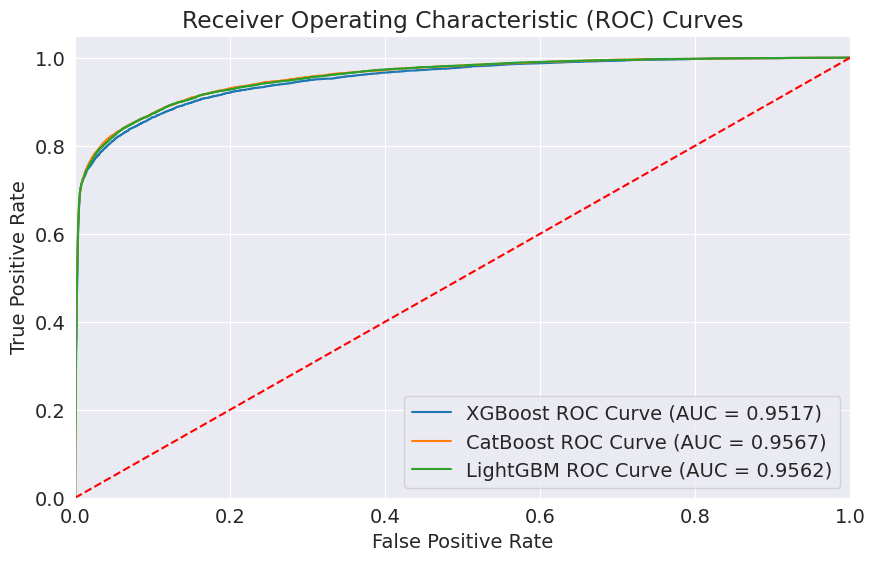

In [119]:
xgb_results, xgb_model = XGB_model(10, **xgb_params)
catb_results, catb_model = CatB_model(10, **catb_params)
lgbm_results, lgbm_model = LGB_model(10, **lgb_params)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.grid(True)
plt.show();

In [116]:
xgb_features = df_train.columns.tolist()
xgb_feature_importances = xgb_model.feature_importances_
xgb_feats = pd.DataFrame({'Feature': xgb_features,
                         'Importance': xgb_feature_importances})
fig = px.bar(xgb_feats, y='Feature', x='Importance', color='Feature', color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.update_layout(title="Features and their importance in XGBoost Classifier",
                  width=1400,
                  height=1200,
                  showlegend=False)
fig.show()

In [117]:
catb_features = df_train.columns.tolist()
catb_feature_importances = catb_model.feature_importances_
catb_feats = pd.DataFrame({'Feature': catb_features,
                         'Importance': catb_feature_importances})
fig = px.bar(catb_feats, y='Feature', x='Importance', color='Feature', color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.update_layout(title="Features and their importance in CatBoost Classifier",
                  width=1400,
                  height=1200,
                  showlegend=False)
fig.show()

In [118]:
lgbm_features = df_train.columns.tolist()
lgbm_feature_importances = lgbm_model.feature_importances_
lgbm_feats = pd.DataFrame({'Feature': lgbm_features,
                         'Importance': lgbm_feature_importances})
fig = px.bar(lgbm_feats, y='Feature', x='Importance', color='Feature', color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.update_layout(title="Features and their importance in LightGBM Classifier",
                  width=1400,
                  height=1200,
                  showlegend=False)
fig.show()

We can inspect a tree in the LightGBM model.

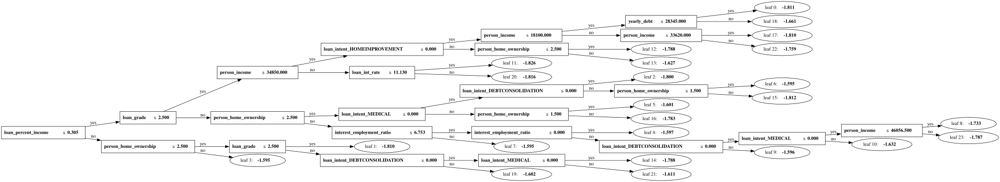

In [121]:
import lightgbm
viz = lightgbm.create_tree_digraph(lgbm_model.booster_)
viz

Reading submission file template and filling results

In [80]:
df_result = pd.read_csv('/kaggle/input/loans-submission/sample_submission.csv')
df_result['loan_status'] = 0.15*xgb_results + 0.35*cat_results + 0.5*lgbm_results

Creating CSV file for final submission

In [81]:
df_result.to_csv('/kaggle/working/submission5.csv', index=False)